In [1]:
# Fork de https://github.com/orga-de-datos/practicas

In [2]:
import sklearn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.datasets import make_moons, make_circles, make_classification
import matplotlib.animation as mpl_animation
import matplotlib
from IPython.display import HTML, Markdown


In [3]:
sns.set()

# Perceptrón base

Primero veamos la estructura mas basica posible: el perceptron base.

## Generacion de dataset

Armaremos primero un dataset sintetico de dos clases linealmente separables. Esto quiere decir que podemos encontrar un hiperplano que separe el espacio de modo que cada clase quede en una sola region. Que sea linealmente separable nos sera importante para entender algunos detalles.

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


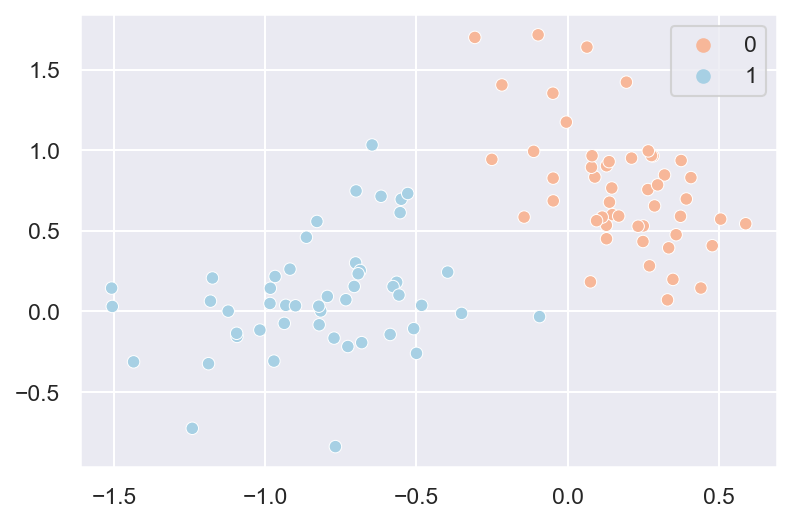

In [4]:
def rotate(p, origin=(0, 0), degrees=0):
    angle = np.deg2rad(degrees)
    R = np.array([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]])
    o = np.atleast_2d(origin)
    p = np.atleast_2d(p)
    return np.squeeze((R @ (p.T - o.T) + o.T).T)


X, y = make_classification(
    n_features=2,
    n_redundant=0,
    n_informative=2,
    random_state=1,
    n_clusters_per_class=1,
    class_sep=0.55,
)

X = rotate(X, degrees=30)

plt.figure(dpi=150)
sns.scatterplot(X[:, 0], X[:, 1], hue=y, palette='RdBu')
plt.show()

## Modelo en numpy

Hacer una red neuronal es numpy es, en lineas generales, una mala idea. Sirve de todos modos a propositos educativos, para que podamos jugar.

### Perceptron base
Recordemos que nuestras features vive en $R^2$. Y recordemos:

$$f(b + \sum_{i=1}^{n}x_i \times w_i)$$

Donde:
- $f$ es nuestra funcion de activacion
- $b$ es el bias
- $x_i$ es la i-esima feature de una observacion
- $w_i$ es el peso de la red para las i-esimas features

Como entrenaremos nuestro perceptron?

```text
mientras no sea estable:
    para cada par X_i, y_i:
        yhat = f(X_i*w + b)
        si y_hat != y_i:
            actualizo w con X_i
            actualizo b
```

> estable: no se han actualizado los pesos durante todo un epoch

In [5]:
epoch = 1

b = 0.0
w = np.zeros(2).T


def heaviside_step(x):
    return max(0.0, np.sign(x))


while True:
    stable = True
    print(f"epoch {epoch}")
    for (Xi, yi) in zip(X, y):
        yhat = heaviside_step(np.dot(Xi, w) + b)

        w += (yi - yhat) * Xi
        b += yi - yhat
        if (yi != yhat).any():
            stable = False
        # stable &= yi == yhat

    if stable:
        break

    epoch += 1

epoch 1
epoch 2


In [6]:
def plot_hiperplane(w, b, X, y, title=None, _ax=None):
    ax = _ax
    if _ax is None:
        fig, ax = plt.subplots(dpi=150)
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=y, palette='RdBu', alpha=1, ax=ax)

    G = 500

    xlim = ax.get_xlim()
    ylim = ax.get_ylim()

    xx, yy = np.meshgrid(np.linspace(*xlim, G), np.linspace(*ylim, G))
    z = np.dot(np.c_[xx.ravel(), yy.ravel()], w) + b
    z = z.reshape(xx.shape)

    ax.contourf(xx, yy, z, alpha=0.1, cmap='RdBu')

    x_vals = np.array(xlim)
    y_vals = b - (w[0] / w[1]) * x_vals
    ax.plot(x_vals, y_vals, ':', color='Purple')

    ax.set_ylim(*ylim)
    ax.set_xlim(*xlim)

    if title:
        ax.set_title(title)
    if _ax is None:
        plt.show()
    else:
        return ax

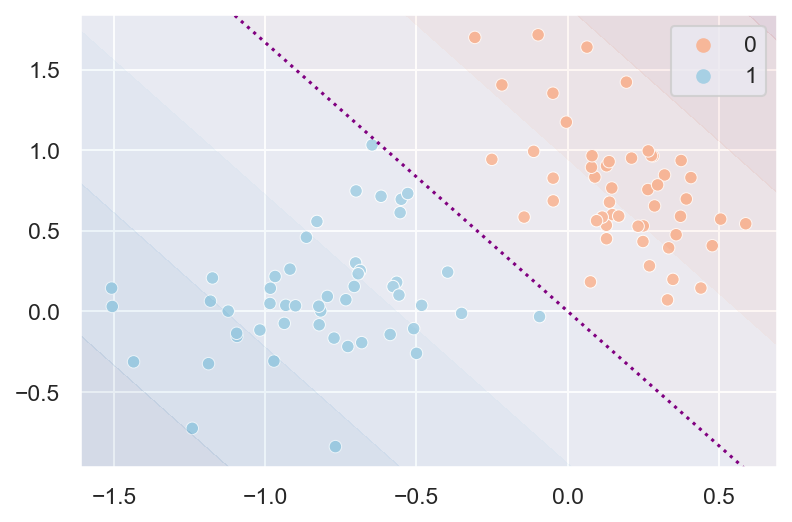

In [7]:
plot_hiperplane(w, b, X, y)

In [8]:
display(
    Markdown(
        f"""Entonces, luego de 2 epochs es estable y ha encontrado un hiperplano separador $$y = {b} - {w[0]/w[1]:.2f}x$$"""
    )
)

Entonces, luego de 2 epochs es estable y ha encontrado un hiperplano separador $$y = 0.0 - 1.67x$$

Se puede demostrar la convergencia bajo ciertas condiciones.

- [aca por ejemplo](https://www.cse.iitb.ac.in/~shivaram/teaching/old/cs344+386-s2017/resources/classnote-1.pdf)

# Learning rate
Ahora tenemos nuestro perceptron base. Una pequenia (perdon, no tengo la enie mapeada (ni tildes)) modificacion que podemos hacerle es pesar $X_i$ al momento de actualizar $w$ y $b$.

## Momento de reflexion
Nos sirve de algo esto si iteramos en el mismo orden las observaciones y son linealmente separables nuestras clases?

## Dataset no-linealmente-separable
Para ilustrar por que nos puede servir una tasa de aprendizaje, utilizemos un dataset no-linealmente-separable.

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


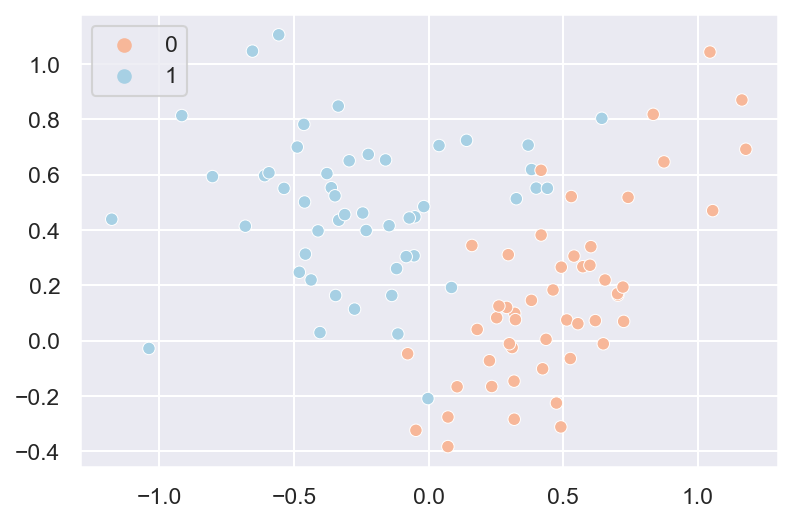

In [9]:
X, y = make_classification(
    n_features=2,
    n_redundant=0,
    n_informative=2,
    random_state=1,
    n_clusters_per_class=1,
    class_sep=0.35,
)
X = rotate(X, degrees=-30)

# X, y = make_moons(n_samples=1000, random_state=0, noise=0.1)

plt.figure(dpi=150)
sns.scatterplot(X[:, 0], X[:, 1], hue=y, palette='RdBu')
plt.show()

In [10]:
def plot_lr(X, y, lr=0.1, epochs=50):
    fig, ax = plt.subplots(dpi=150)

    def _plot_hiperplane(frame):
        ax.clear()
        epoch, b, w = frame
        s = " + " if w[0] < 0 else " - "
        plot_hiperplane(
            w,
            b,
            X,
            y,
            f"epoch {epoch} | $y = {b:.2f}{s}{np.abs(w[0]/w[1]):.2f}x$",
            _ax=ax,
        )
        return

    def train_with_learning_rate(X, y, lr=0.1, epochs=50):
        max_epochs = epochs
        epoch = 1

        alpha = lr
        b = 0.0
        w = np.zeros(2).T

        frames = [(epoch, np.copy(b), np.copy(w))]

        while True:
            if epoch >= max_epochs:
                break
            stable = True
            for (Xi, yi) in zip(X, y):
                yhat = max(0.0, np.sign(np.dot(Xi, w) + b))

                w += (yi - yhat) * Xi * alpha
                b += (yi - yhat) * alpha
                stable &= yi == yhat

            if stable:
                break

            epoch += 1
            frames.append((epoch, np.copy(b), np.copy(w)))

        return frames

    def init_anim():
        pass

    anim = mpl_animation.FuncAnimation(
        fig,
        _plot_hiperplane,
        frames=train_with_learning_rate(X, y, lr, epochs),
        interval=200,
        init_func=init_anim,
    )
    plt.close()
    matplotlib.rc('animation', html='jshtml')
    display(HTML(anim.to_jshtml()))

In [11]:
plot_lr(X, y, lr=0.001, epochs=50)

/tmp/ipykernel_950995/2318642183.py:13: RuntimeWarning: invalid value encountered in double_scalars
  f"epoch {epoch} | $y = {b:.2f}{s}{np.abs(w[0]/w[1]):.2f}x$",
/tmp/ipykernel_950995/1780482718.py:19: RuntimeWarning: invalid value encountered in double_scalars
  y_vals = b - (w[0] / w[1]) * x_vals


In [12]:
plot_lr(X, y, lr=1.0, epochs=50)

/tmp/ipykernel_950995/2318642183.py:13: RuntimeWarning: invalid value encountered in double_scalars
  f"epoch {epoch} | $y = {b:.2f}{s}{np.abs(w[0]/w[1]):.2f}x$",
/tmp/ipykernel_950995/1780482718.py:19: RuntimeWarning: invalid value encountered in double_scalars
  y_vals = b - (w[0] / w[1]) * x_vals


In [13]:
plot_lr(X, y, lr=2.0, epochs=50)

/tmp/ipykernel_950995/2318642183.py:13: RuntimeWarning: invalid value encountered in double_scalars
  f"epoch {epoch} | $y = {b:.2f}{s}{np.abs(w[0]/w[1]):.2f}x$",
/tmp/ipykernel_950995/1780482718.py:19: RuntimeWarning: invalid value encountered in double_scalars
  y_vals = b - (w[0] / w[1]) * x_vals


# Funciones de activacion

Hasta aqui, teniamos dos clases y queriamos predecir la clase. No siempre sera el caso. Podriamos tener un problema mutliclase, podriamos querer predecir $P(y_i=1|X_i)$. Por otro lado vimos en la teorica que si quisieramos resolver un problema no-linealmente-separable como el de recien, deberiamos _combinar_ perceptrones mediante funciones de activacion no lineales.

Pero que funciones de activacion podemos usar? Cuales son las propiedades que deben cumplir?

## Identidad

La función identidad está dada por $$f(x) = x$$

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


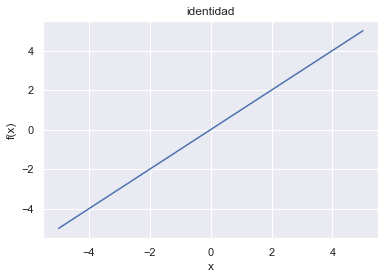

In [14]:
x = np.linspace(-5, 5)
y = x

plt.figure()
sns.lineplot(x, y)
plt.title("identidad")
plt.ylabel("f(x)")
plt.xlabel("x")
plt.show()

## Escalón

La función escalón está dada por $$f(x)= \left\{ \begin{array}{lcc}
             0 &   si  & x \lt 0 \\
             \\ 1 &  si & x \geq 0
             \end{array}
   \right. $$

Te suena de algun lado?

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


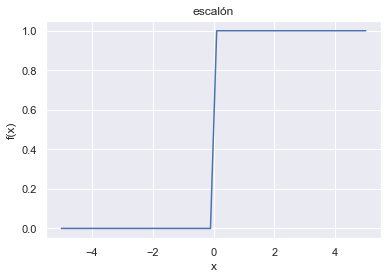

In [15]:
x = np.linspace(-5, 5)
y = np.maximum(0.0, np.sign(x))

plt.figure()
sns.lineplot(x, y)
plt.title("escalón")
plt.ylabel("f(x)")
plt.xlabel("x")
plt.show()

## Tangente hiperbólica

La función tangente hiperbólica está dada por $$f(x) = \tanh{x}$$

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


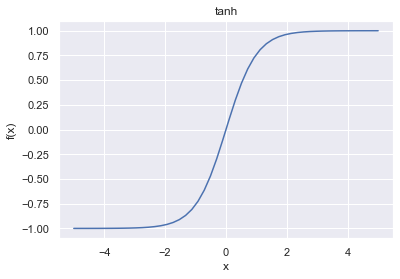

In [16]:
x = np.linspace(-5, 5)
y = np.tanh(x)

plt.figure()
sns.lineplot(x, y)
plt.title("tanh")
plt.ylabel("f(x)")
plt.xlabel("x")
plt.show()

## ReLU (Rectified Linear Unit)

La función Relu viene dada por $$f(x) = \max(0, x) = \left\{ \begin{array}{lcc}
             0 &   si  & x \lt 0 \\
             \\ x &  si & x \geq 0
             \end{array}
   \right. $$

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


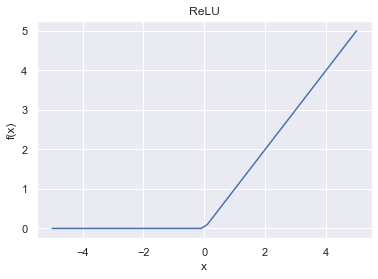

In [17]:
x = np.linspace(-5, 5)
y = np.maximum(0, x)

plt.figure()
sns.lineplot(x, y)
plt.title("ReLU")
plt.ylabel("f(x)")
plt.xlabel("x")
plt.show()

# Primera red neuronal (MLP)

Resolvamos el ejemplo de antes! Veamos nuestro bello dataset, primero.

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


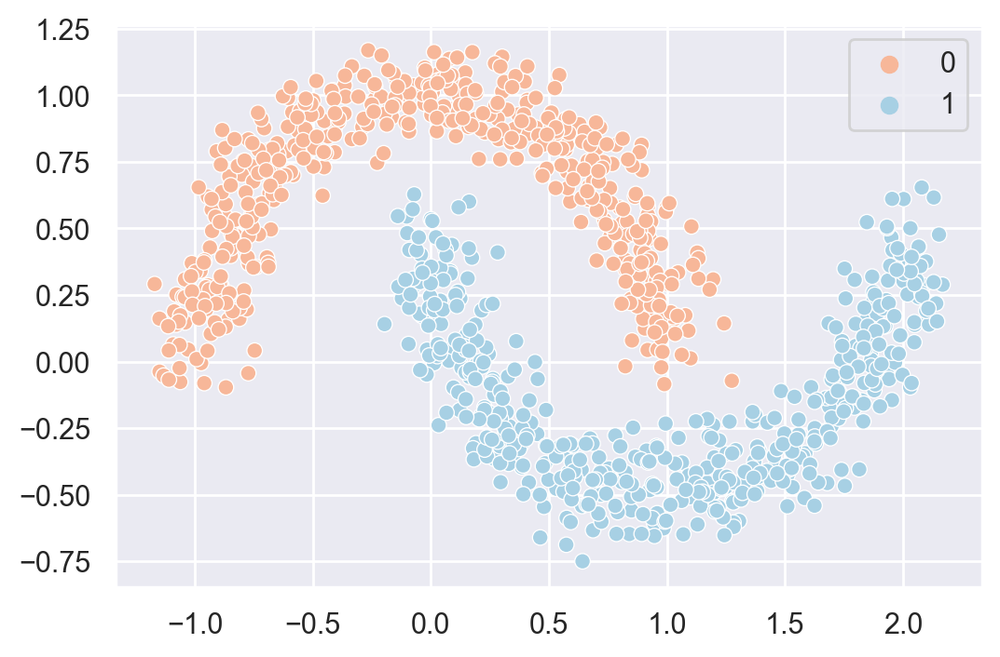

In [18]:
X, y = make_moons(n_samples=1000, random_state=117, noise=0.1)

plt.figure(dpi=200)
sns.scatterplot(X[:, 0], X[:, 1], hue=y, palette='RdBu')
plt.show()

Con un poco de buen pulso y una birome podriamos encontrar una curva que separe las dos clases, no? Pero las impresiones a color estan caras, asi que haremos una red neuronal para encontrar la curva y graficarla.

Como dijimos antes, hacerlo en numpy podria funcionar para propositos educativos (les invitamos a intentarlo!) pero es poco practico par la Vida Real™. Hay variedades de frameworks para construir redes neuronales, pero mostraremos dos de los mas conocidos.

# Keras

[Keras](https://keras.io) se describe como:

> Deep learning for humans.

> Keras is an API designed for human beings, not machines. Keras follows best practices for reducing cognitive load: it offers consistent & simple APIs, it minimizes the number of user actions required for common use cases, and it provides clear & actionable error messages. It also has extensive documentation and developer guides.

Se puede acceder con tensorflow como [`tf.keras`](https://www.tensorflow.org/guide/keras?hl=es). [TensorFlow](https://www.tensorflow.org/?hl=es) es otro framework, desarrollado por Google.

In [19]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')

try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except Exception as e:
    print(e)
    pass

2022-07-25 21:15:39.098889: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-25 21:15:40.333877: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-07-25 21:15:40.363445: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 21:15:40.363630: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:42:00.0 name: NVIDIA GeForce RTX 2070 SUPER computeCapability: 7.5
coreClock: 1.8GHz coreCount: 40 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 417.29GiB/s
2022-07-25 21:15:40.363668: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-25 21:15:40.367737: I tensorflow/stream_execut

In [20]:
from tensorflow import keras

in_l = keras.layers.Input(shape=(2,))
d1 = keras.layers.Dense(32, activation='relu')(in_l)
out_l = keras.layers.Dense(1, activation='sigmoid')(d1)

m = keras.models.Model(inputs=[in_l], outputs=[out_l])

2022-07-25 21:15:40.411859: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-25 21:15:40.414037: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 21:15:40.414224: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:42:00.0 name: NVIDIA GeForce RTX 2070 SUPER computeCapability: 7.5
coreClock: 1.8GHz coreCount: 40 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 417.29GiB/s
2022-07-25 21:15:40.414296: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (

In [21]:
m.compile('sgd', loss='binary_crossentropy', metrics=['accuracy'])

In [22]:
m.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 2)]               0         
_________________________________________________________________
dense (Dense)                (None, 32)                96        
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 129
Trainable params: 129
Non-trainable params: 0
_________________________________________________________________


In [23]:
h = m.fit(X, y, epochs=500, batch_size=16, verbose=0, validation_split=0.3)

2022-07-25 21:15:40.970442: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-07-25 21:15:40.982756: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3393180000 Hz
2022-07-25 21:15:41.287615: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-07-25 21:15:41.851769: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so.11


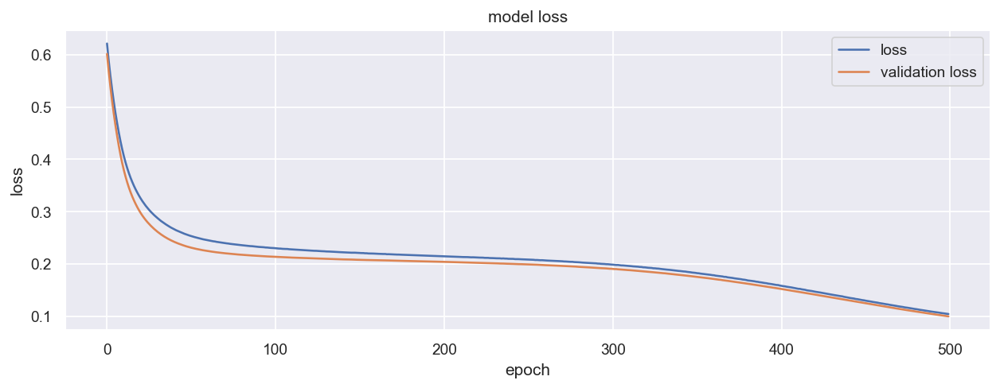

In [24]:
plt.figure(dpi=125, figsize=(12, 4))
plt.plot(h.history['loss'], label="loss")
plt.plot(h.history['val_loss'], label="validation loss")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

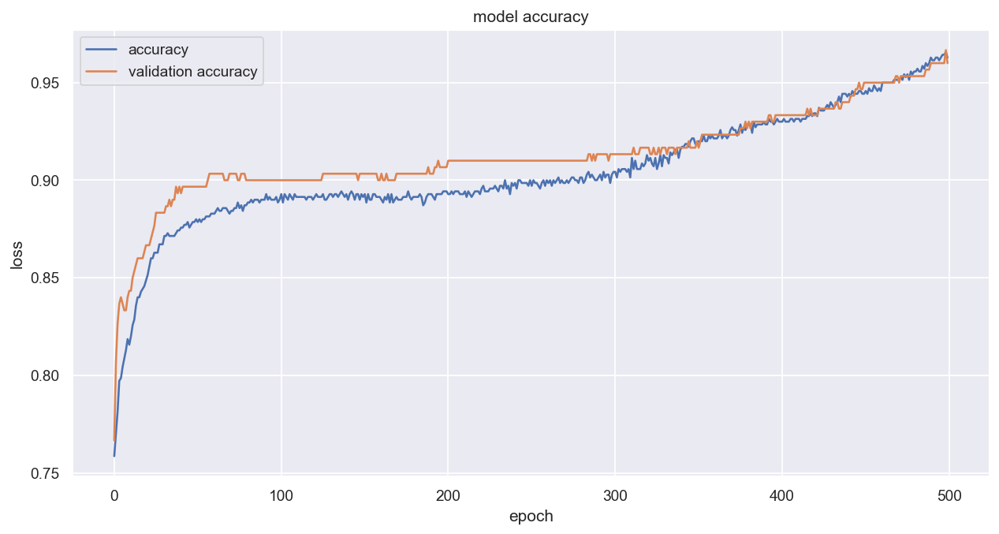

In [25]:
plt.figure(dpi=125, figsize=(12, 6))
plt.plot(h.history['accuracy'], label="accuracy")
plt.plot(h.history['val_accuracy'], label="validation accuracy")
plt.title('model accuracy')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


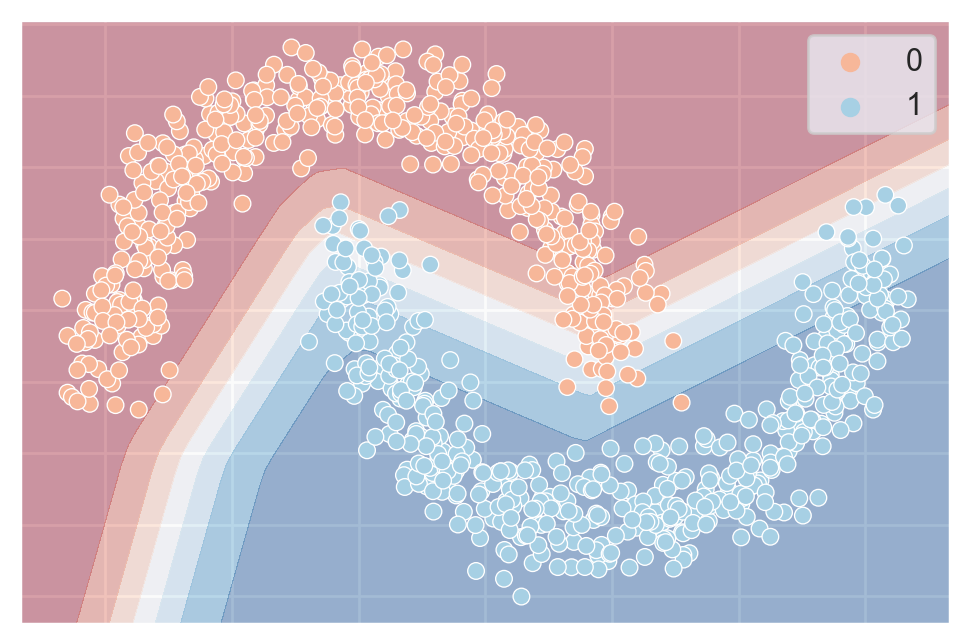

In [26]:
plt.figure(dpi=200)

xrange = X[:, 0].max() - X[:, 0].min()
yrange = X[:, 1].max() - X[:, 1].min()

xlim = (X[:, 0].min() - xrange * 0.05, X[:, 0].max() + xrange * 0.05)
ylim = (X[:, 1].min() - yrange * 0.05, X[:, 1].max() + yrange * 0.05)

G = 250

xx, yy = np.meshgrid(np.linspace(*xlim, G), np.linspace(*ylim, G))
z = m.predict(np.c_[xx.ravel(), yy.ravel()])[:, 0]
z = z.reshape(xx.shape)

plt.contourf(xx, yy, z, alpha=0.4, cmap='RdBu')
ax = sns.scatterplot(X[:, 0], X[:, 1], hue=y, palette='RdBu', alpha=1)
ax.set(yticklabels=[])
ax.set(xticklabels=[])

plt.show()

# PyTorch

[PyTorch](https://pytorch.org) se define como

> An open source machine learning framework that accelerates the path from research prototyping to production deployment.

Fue principalmente desarrollado por Facebook. Es de mas bajo nivel (el equivalente seria mas cercado a tensorflow) pero permite gran flexibilidad, esta muy actualizado y tiene mucho uso en academia.

In [27]:
import torch
from progressbar import progressbar
from sklearn.model_selection import ShuffleSplit

In [28]:
hidden_layers = 128
epochs = 500
val_split = 0.3

# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

idxs = np.arange(len(X))
np.random.shuffle(idxs)
size = int(np.floor(val_split * len(X)))
train_idxs = idxs[size:]
val_idxs = idxs[:size]

train_sampler = torch.utils.data.SubsetRandomSampler(train_idxs)
valid_sampler = torch.utils.data.SubsetRandomSampler(val_idxs)

In [29]:
train = torch.utils.data.TensorDataset(
    torch.from_numpy(X).float(), torch.from_numpy(y).float()
)
train_loader = torch.utils.data.DataLoader(train, batch_size=16, sampler=train_sampler)
val_loader = torch.utils.data.DataLoader(train, batch_size=16, sampler=valid_sampler)

In [30]:
model = torch.nn.Sequential(
    torch.nn.Linear(2, hidden_layers),
    torch.nn.ReLU(),
    torch.nn.Linear(hidden_layers, 1),
    torch.nn.Sigmoid(),
)

In [31]:
loss_fn = torch.nn.BCELoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.01)

In [32]:
losses = []
accuracies = []
val_losses = []
val_accuracies = []

for t in progressbar(range(epochs), max_value=epochs):
    train_loss = 0
    accuracy = 0
    val_loss = 0
    val_accuracy = 0

    model.train()

    for data, target in train_loader:
        optimizer.zero_grad()
        batch_y_pred = model(data)
        loss = loss_fn(batch_y_pred, target.reshape(-1, 1))
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * data.size(0)
        accuracy += ((batch_y_pred.reshape(-1,) > 0.5) == target).sum()

    model.eval()

    for data, target in val_loader:
        batch_y_pred = model(data)
        loss = loss_fn(batch_y_pred, target.reshape(-1, 1))
        val_loss += loss.item() * data.size(0)
        val_accuracy += ((batch_y_pred.reshape(-1,) > 0.5) == target).sum()

    losses.append(train_loss / float(train_loader.sampler.indices.size))
    accuracies.append(accuracy / float(train_loader.sampler.indices.size))
    val_losses.append(val_loss / float(val_loader.sampler.indices.size))
    val_accuracies.append(val_accuracy / float(val_loader.sampler.indices.size))

100% (500 of 500) |######################| Elapsed Time: 0:00:19 Time:  0:00:19


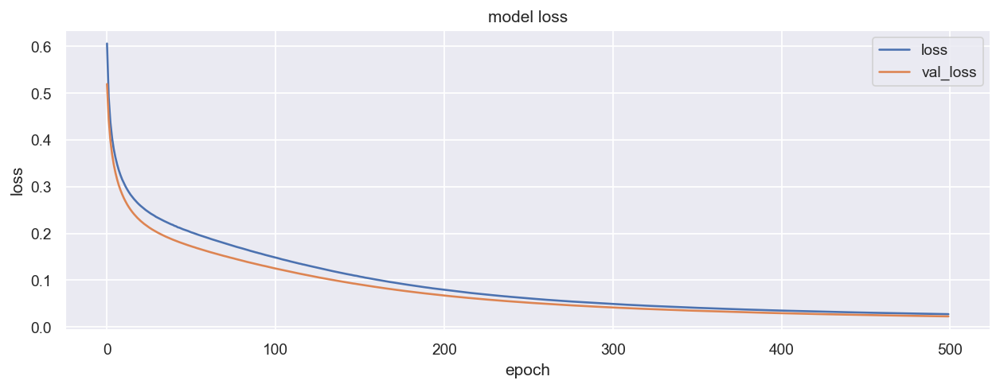

In [33]:
plt.figure(dpi=125, figsize=(12, 4))
plt.plot(losses, label="loss")
plt.plot(val_losses, label="val_loss")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()
plt.show()

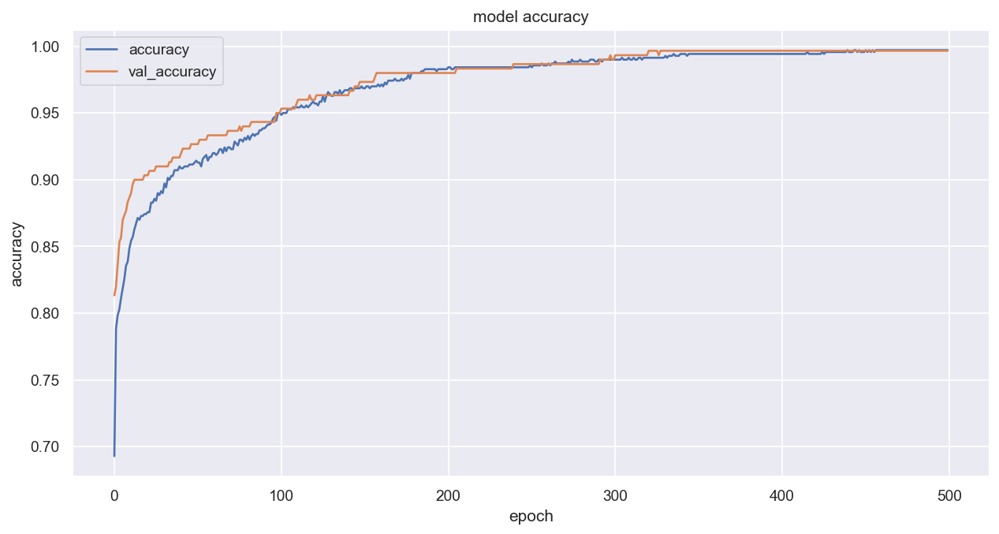

In [34]:
plt.figure(dpi=125, figsize=(12, 6))
plt.plot(accuracies, label="accuracy")
plt.plot(val_accuracies, label="val_accuracy")
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend()
plt.show()

/home/nox/repos/venv/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


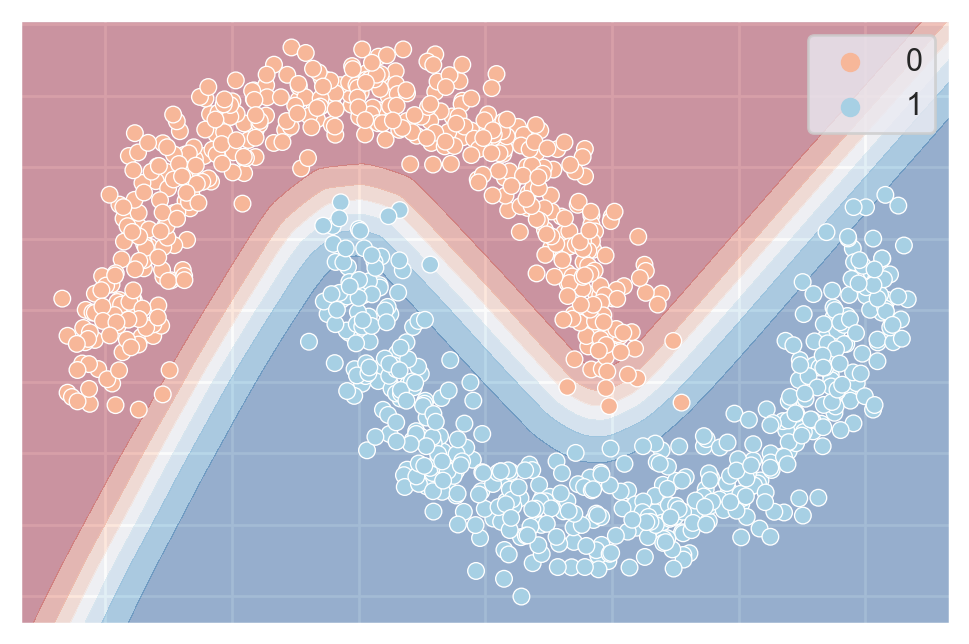

In [35]:
plt.figure(dpi=200)

xrange = X[:, 0].max() - X[:, 0].min()
yrange = X[:, 1].max() - X[:, 1].min()

xlim = (X[:, 0].min() - xrange * 0.05, X[:, 0].max() + xrange * 0.05)
ylim = (X[:, 1].min() - yrange * 0.05, X[:, 1].max() + yrange * 0.05)

G = 250

xx, yy = np.meshgrid(np.linspace(*xlim, G), np.linspace(*ylim, G))

mesh_X = np.c_[xx.ravel(), yy.ravel()]

z = model(torch.from_numpy(mesh_X).float()).detach().numpy()[:, 0]
z = z.reshape(xx.shape)

plt.contourf(xx, yy, z, alpha=0.4, cmap='RdBu')
ax = sns.scatterplot(X[:, 0], X[:, 1], hue=y, palette='RdBu', alpha=1)
ax.set(yticklabels=[])
ax.set(xticklabels=[])

plt.show()

# Funciones de pérdida/costo

Momento... que es ese `binary_crossentropy`?

Es la **funcion de perdida**. Tienen la forma $f(y, y_{hat}) \to R$, se trata de minimizar este error. Al aplicar descenso por gradiente (o la regla de la cadena en backpropagation) usamos este valor para ajustar los parametros del modelo.

La implementacion de distintas funciones de activacion dependen del framework. La funcion de costo se debe decidir en base al entorno del problema que estemos tratando de resolver.

## Algunas funciones de perdida comunes
Mas o menos lo mismo de siempre, pero por las dudas...

### Clasificacion

#### Binary crossentropy
Sirve cuando se tiene un problema de clasificacion binario.

$$H_p = - \frac{1}{N} \sum_{i=1}^{N} y_i \log{(p(y_i))} + (1 - y_i) \log{(1-p(y_i))}$$

- [keras](https://keras.io/api/losses/probabilistic_losses/#binarycrossentropy-function)
- [Explicacion visual](https://towardsdatascience.com/understanding-binary-cross-entropy-log-loss-a-visual-explanation-a3ac6025181a)

#### Categorical crossentropy
Sirve cuando se tiene un problema de clasificacion multiclase.

$$C = -\frac{1}{N} \sum_{i=1}^{N} \sum_{c=1}^{C} 1_{y_i \in C_c} \log p_{modelo}[y_i \in C_c] $$

En el caso que el problema no sea multi-label, podemos simplificar la expresion a

$$C = -\frac{1}{N} \sum_{i=1}^{N} \log p_{modelo}[y_i \in C_{y_i}] $$

- [keras](https://keras.io/api/losses/probabilistic_losses/#categoricalcrossentropy-function)

### Regresion

#### MSE
$$\text{MSE}(y, \hat{y}) = \frac{1}{n_\text{samples}} \sum_{i=0}^{n_\text{samples} - 1} (y_i - \hat{y}_i)^2$$

- [keras](https://keras.io/api/losses/regression_losses/#meansquarederror-function)

#### MAE
$$\text{MAE}(y, \hat{y}) = \frac{1}{n_{\text{samples}}} \sum_{i=0}^{n_{\text{samples}}-1} \left| y_i - \hat{y}_i \right|$$

- [keras](https://keras.io/api/losses/regression_losses/#meanabsoluteerror-function)

#### MAPE
$$\text{MAPE}(y, \hat{y}) = \frac{1}{n_{\text{samples}}} \sum_{i=0}^{n_{\text{samples}}-1} 100 * \frac{\left| y_i - \hat{y}_i \right|}{y_i}$$


- [keras](https://keras.io/api/losses/regression_losses/#meanabsolutepercentageerror-function)

# Optimizadores

Si nos fijamos en el modelo de Keras, tenemos otro parametro: `optimizer`. Es el metodo para optimizar. Vimos en la teorica SGD, pero hay otros con distintas propiedaes.

# MNIST

In [36]:
# Based off

import keras
from keras.datasets import mnist

(x_train, y_train),(x_test,y_test)=mnist.load_data()

In [37]:
x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
x_test = x_test.reshape(x_test.shape[0], 28, 28, 1)
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
x_train = (x_train - x_train.mean()) / x_train.std()
x_test = (x_test - x_test.mean()) / x_test.std()
y_train = keras.utils.to_categorical(y_train,10)
y_test = keras.utils.to_categorical(y_test,10)
input_shape = (28,28,1)

In [52]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32,kernel_size=(5,5),strides=(1,1),activation='relu',input_shape=input_shape))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(keras.layers.Dropout(0.1))
model.add(keras.layers.Conv2D(64,(5,5),activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPooling2D(pool_size=(2,2),strides=(2,2)))
model.add(keras.layers.Dropout(0.05))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(1024,activation='relu'))
model.add(keras.layers.Dense(10,activation='softmax'))
model.compile(loss=keras.losses.categorical_crossentropy,optimizer='adam',metrics=['accuracy'])
history = model.fit(x_train,y_train,batch_size=128,epochs=10,verbose=1,validation_split=0.3)

score = model.evaluate(x_test, y_test, verbose=1)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/10
329/329 [==============================] - 2s 6ms/step - loss: 0.1628 - accuracy: 0.9555 - val_loss: 0.1697 - val_accuracy: 0.9513
Epoch 2/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0434 - accuracy: 0.9863 - val_loss: 0.0538 - val_accuracy: 0.9843
Epoch 3/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0277 - accuracy: 0.9912 - val_loss: 0.0523 - val_accuracy: 0.9853
Epoch 4/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0250 - accuracy: 0.9919 - val_loss: 0.0557 - val_accuracy: 0.9844
Epoch 5/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0225 - accuracy: 0.9927 - val_loss: 0.0544 - val_accuracy: 0.9859
Epoch 6/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0156 - accuracy: 0.9950 - val_loss: 0.0427 - val_accuracy: 0.9892
Epoch 7/10
329/329 [==============================] - 2s 5ms/step - loss: 0.0121 - accuracy: 0.9960 - val_loss: 0.0458 - val_accuracy: 0.9891
Epoch 

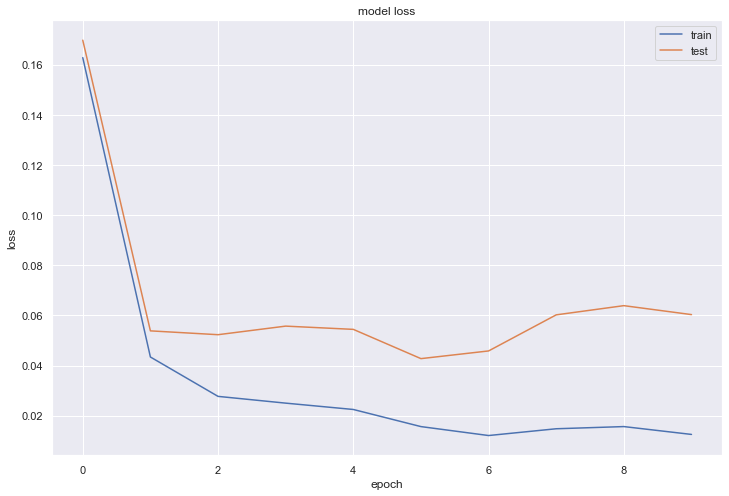

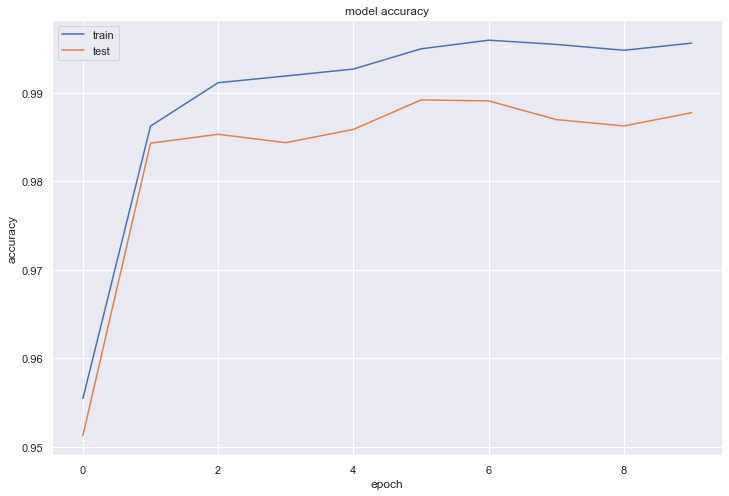

In [55]:
plt.figure(figsize=(12,8))

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='best')
plt.show()

plt.figure(figsize=(12,8))

plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='best')
plt.show()

In [56]:
import numpy as np
idx = np.random.randint(0, len(x_test))

In [57]:
model.predict_classes(x_test[idx].reshape(1,28,28,1))

/home/nox/repos/venv/lib64/python3.8/site-packages/tensorflow/python/keras/engine/sequential.py:455: UserWarning: `model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
  warnings.warn('`model.predict_classes()` is deprecated and '


array([9])

In [58]:
y_test[idx]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1.], dtype=float32)

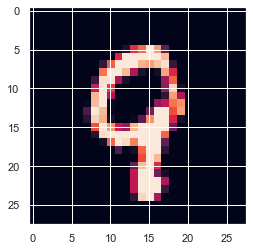

In [59]:
plt.imshow(x_test[idx])

## Demo en vivo!

In [60]:
raise ValueError()

ValueError: 

In [61]:
from ipywidgets import Image

from ipywidgets import ColorPicker, IntSlider, link, AppLayout, HBox, Button, Layout

from ipycanvas import RoughCanvas, hold_canvas, Canvas

In [62]:
width = 800
height = 400

In [82]:
canvas = Canvas(width=width, height=height, sync_image_data=True, layout=Layout(border="solid"))

drawing = False
position = None
shape = []


def on_mouse_down(x, y):
    global drawing
    global position
    global shape

    drawing = True
    position = (x, y)
    shape = [position]


def on_mouse_move(x, y):
    global drawing
    global position
    global shape

    if not drawing:
        return

    with hold_canvas():
        canvas.stroke_line(position[0], position[1], x, y)

        position = (x, y)

    shape.append(position)


def on_mouse_up(x, y):
    global drawing
    global position
    global shape

    drawing = False

    with hold_canvas():
        canvas.stroke_line(position[0], position[1], x, y)

    shape = []


canvas.on_mouse_down(on_mouse_down)
canvas.on_mouse_move(on_mouse_move)
canvas.on_mouse_up(on_mouse_up)

canvas.stroke_style = "#000000"
canvas.line_width = 8

clear = Button(description="Clear")
picker = ColorPicker(description="Color:", value="#000000")

def _canvas_clear(x):
    canvas.clear()

clear.on_click(_canvas_clear)

link((picker, "value"), (canvas, "stroke_style"))
link((picker, "value"), (canvas, "fill_style"))

def save_to_file(*args, **kwargs):
    try:
        canvas.to_file("digitos.png")
    except Exception as e:
        print(e)

save = Button(description="Save")
save.on_click(save_to_file)

HBox((canvas, picker, clear, save), layout=Layout(border="solid"))

Analyzing digitos.png
(400, 800, 4)


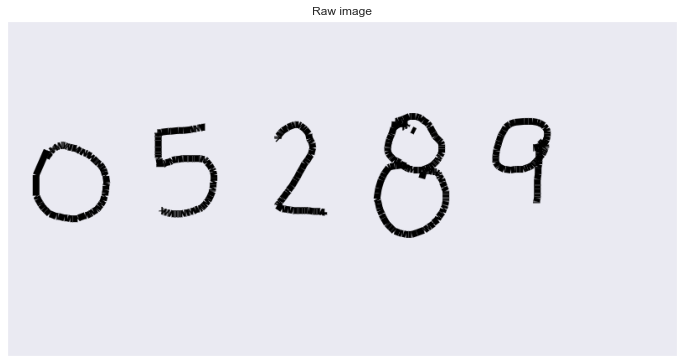

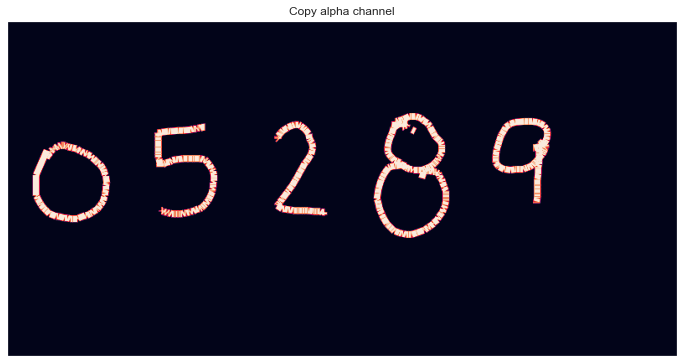

5 objects found


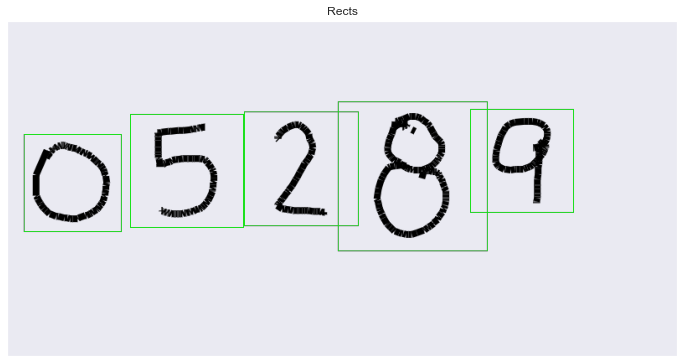

Predict for 5 rects


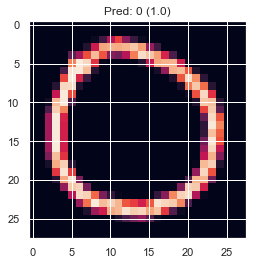

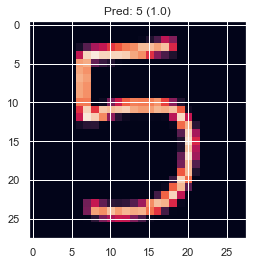

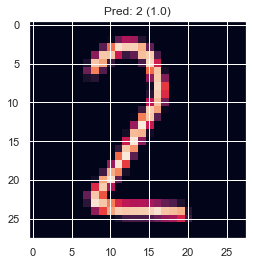

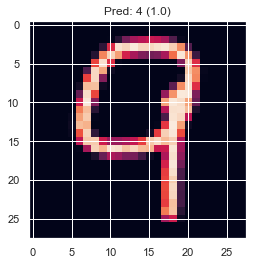

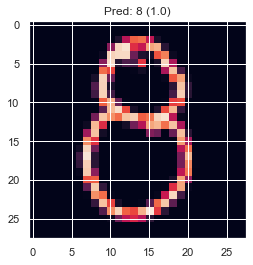

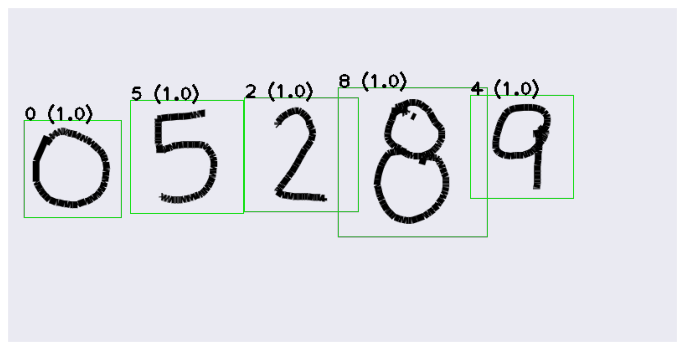

In [103]:
import cv2
import numpy as np
import sys
import keras
from skimage.feature import hog

nn = model

image_path = "digitos.png"
#image_path = "/home/nox/Downloads/digitos"

print("Analyzing {}".format(image_path))
im = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

print(im.shape)

plt.figure(figsize=(12,8))
plt.imshow(im)
plt.xticks(())
plt.yticks(())
plt.title("Raw image")
plt.show()

im_gray = im[:,:,3].copy()


plt.figure(figsize=(12,8))
plt.imshow(im_gray)
plt.xticks(())
plt.yticks(())
plt.title("Copy alpha channel")
plt.show()

# Find contours in the image
ctrs, hierarchy = cv2.findContours(im_gray, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
# _, ctrs, _ = cv2.findContours(im_th, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)

def transform_rects(rect,factor=0.10):
    x,y,w,h = rect
    x -= (h-w)//2
    w = h
    x -= int(w*factor)
    w = int(w*(1.0+2*factor))
    y -= int(h*factor)
    h = int(h*(1.0+2*factor))
    return [x,y,w,h]

# Get rectangles contains each contour
rects = [cv2.boundingRect(ctr) for ctr in ctrs]
rects = map(transform_rects,rects)
rects = filter(lambda x: x[2]>=20 or x[3]>=20,rects)
rects = filter(lambda x: x[0]>=0 and x[1]>=0 and x[0]<im_th.shape[1] and x[1]<im_th.shape[0],rects)
rects = [*rects]

print("{} objects found".format(len(rects)))

for rect in rects:
    # Draw the rectangles
    x,y,w,h = rect
    cv2.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0, 255), 1)

plt.figure(figsize=(12,8))
plt.title("Rects")
plt.imshow(im)
plt.xticks(())
plt.yticks(())
plt.show()

print(f"Predict for {len(rects)} rects")

for rect in rects:
    # Draw the rectangles
    x,y,w,h = rect
    # Make the rectangular region around the digit
    roi = im_gray[y:y+h, x:x+w]
    # Resize the image
    roi = cv2.resize(roi, (28, 28), interpolation=cv2.INTER_AREA)
    #roi = cv2.dilate(roi, (3, 3))
    # roi = (roi - x_train.mean()) / x_train.std()
    roi = roi.reshape(1,28,28,1)
    probas  = nn.predict(roi.reshape(1,28,28,1))
    pred_class = np.argmax(probas)
    proba = np.max(probas)
    plt.title(f"Pred: {pred_class} ({proba})")
    plt.imshow(roi.reshape(28,28,1))
    plt.show()
    cv2.putText(im, f"{pred_class} ({proba})", (x, y), cv2.FONT_HERSHEY_PLAIN, 1.5, (0, 0, 0, 255), 2)
    
plt.figure(figsize=(12,8))
plt.imshow(im)
plt.xticks(())
plt.yticks(())
plt.show()